# Learning Computer Vision and NLP with Image Captioning

## Motivation


## Project Overview

## Dataset
* **Name**: 
* **Contents**: 
* **Characteristics**: 

## Tools and Libraries


In [1]:
%matplotlib inline
import os, random
import pandas as pd 
import torch
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import torchvision.transforms as transforms
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim
from torch.utils.data import Subset
from torchvision.datasets import CocoCaptions
from torch.utils.tensorboard import SummaryWriter


from helpers import Vocabulary, MyCollate, visualize_dataset, save_checkpoint,\
                    load_checkpoint, validation_loss, compute_bleu_scores, compute_meteor_score,\
                    get_logdir, load_pretrained_embeddings, linear_tfr, log_to_tensorboard,\
                    visualize_caption_generation


## Hyperparameters and Configuration Parameters


In [2]:
config = {
    'dataset': 'MS COCO',   #Supported values are 'MS COCO', 'Flickr30k', and 'Flickr8k'
    'batch_size': 8,
    'learning_rate': 75e-6,
    'epochs': 250,
    'num_workers' : 8,
    'embed_size': 512,
    'hidden_size': 512,
    'num_layers': 1,  # Number of RNN layers
    'max_len': 50  # Maximum length of caption (based on MS COCO dataset, test max=49, val max=50)
}


## Dataset Import
In this section, the MS COCO dataset is imported for use in the project. This dataset includes a vast collection of images along with associated captions. To ensure the data has been imported correctly and to provide a visual understanding of the dataset, three random images and their corresponding captions are displayed below.

In [3]:
home = os.path.expanduser("~")

data_paths = {
    'COCO': {
        'train': {
            'root': os.path.join(home, 'ML_project/Image-Captioner/data/train2017'),
            'annFile': os.path.join(home, 'ML_project/Image-Captioner/data/annotations/captions_train2017.json')
        },
        'val': {
            'root': os.path.join(home, 'ML_project/Image-Captioner/data/val2017'),
            'annFile': os.path.join(home, 'ML_project/Image-Captioner/data/annotations/captions_val2017.json')
        },
        'test': {
            'root': os.path.join(home, 'ML_project/Image-Captioner/data/test2017')
        }
    },
    'Flickr8k': {
        'root': os.path.join(home, 'ML_project/Image-Captioner/data/flickr8k/Images'),
        'annFile': os.path.join(home, 'ML_project/Image-Captioner/data/flickr8k/captions.txt')
    },
    'Flickr30k': {
        'root': os.path.join(home, 'ML_project/Image-Captioner/data/flickr30k/Images'),
        'annFile': os.path.join(home, 'ML_project/Image-Captioner/data/flickr30k/captions.txt')
    },
    'Test_Set': {
        'root': os.path.join(home, 'ML_project/Image-Captioner/data/test_set/Images'),
        'annFile': os.path.join(home, 'ML_project/Image-Captioner/data/test_set/captions.txt')
    }
}


class CustomFlickrDataset(Dataset):
    def __init__(self, root, annFile, transform=None, freq_threshold=5):
        self.root = root
        self.df = pd.read_csv(annFile)
        self.transform = transform
        self.eval_mode = False

        # Group the captions by image, each image has an associated list of 5 captions
        self.grouped = self.df.groupby("image")["caption"].apply(list).reset_index()
        self.imgs = self.grouped["image"]
        self.all_captions = self.grouped["caption"]

        # Initialize vocabulary and build vocab
        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocabulary(self.df["caption"].tolist())

    def __len__(self):
        return len(self.grouped)
    
    # Returns captions as lists of numericalized tokens, corresponding to indices of words in the vocab
    def __getitem__(self, index):
        captions_for_image = self.all_captions[index]
        
        if self.eval_mode:
            captions = captions_for_image
        else:
            captions = [random.choice(captions_for_image)]

        img_id = self.imgs[index]
        img = Image.open(os.path.join(self.root, img_id)).convert("RGB")

        if self.transform is not None:
            img = self.transform(img)

        numericalized_captions = []
        for caption in captions:
            numericalized_caption = [self.vocab.stoi["<start>"]]
            numericalized_caption += self.vocab.numericalize(caption)
            numericalized_caption.append(self.vocab.stoi["<end>"])
            numericalized_captions.append(torch.tensor(numericalized_caption))

        if self.eval_mode:
            return img, numericalized_captions
        else:
            return img, numericalized_captions[0]


    def set_vocab(self, vocab):
        self.vocab = vocab

    # These functions should be called at the beginning and end of evaluation functions (BLEU, METEOR, etc.)
    # When eval_mode is true, allows __getitem__ to return a list of all 5 captions for evaluation purposes
    # When eval_mode is false, __getitem__ returns a random caption amongst the 5 for training purposes
    def set_eval_mode(self):
        self.eval_mode = True
    
    def set_train_mode(self):
        self.eval_mode = False


# CustomCocoDataset is setup to work exactly like the FlickrDataset above, 
# but uses the CocoCaptions object to help load the data
class CustomCocoDataset(Dataset):
    def __init__(self, root, annFile, transform=None, freq_threshold=5, vocabFile=None):
        self.root = root
        self.coco = CocoCaptions(root, annFile, transform=transform)
        self.transform = transform
        self.eval_mode = False
        

        if vocabFile == None:
            # Collect all captions
            all_captions = []
            for _, captions in self.coco:
                all_captions.extend(captions)
        
            # Initialize vocabulary and build vocab
            self.vocab = Vocabulary(freq_threshold)
            self.vocab.build_vocabulary(all_captions)
            self.vocab.save_vocab('COCO_vocab.json')
        else:
            self.vocab = Vocabulary.load_vocab(vocabFile)
        
    def __len__(self):
        return len(self.coco)

    def __getitem__(self, index):
        img, captions_for_image = self.coco[index]

        if self.eval_mode:
            captions = captions_for_image
        else:
            captions = [random.choice(captions_for_image)]
            
        numericalized_captions = []
        for caption in captions:
            numericalized_caption = [self.vocab.stoi["<start>"]]
            numericalized_caption += self.vocab.numericalize(caption)
            numericalized_caption.append(self.vocab.stoi["<end>"])
            numericalized_captions.append(torch.tensor(numericalized_caption))
            
        if self.eval_mode:
            return img, numericalized_captions
        else:
            return img, numericalized_captions[0]
    
    def set_vocab(self, vocab):
        self.vocab = vocab

    def set_eval_mode(self):
        self.eval_mode = True

    def set_train_mode(self):
        self.eval_mode = False



## Data Initialization and Visualization

loading annotations into memory...
Done (t=0.39s)
creating index...
index created!
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!


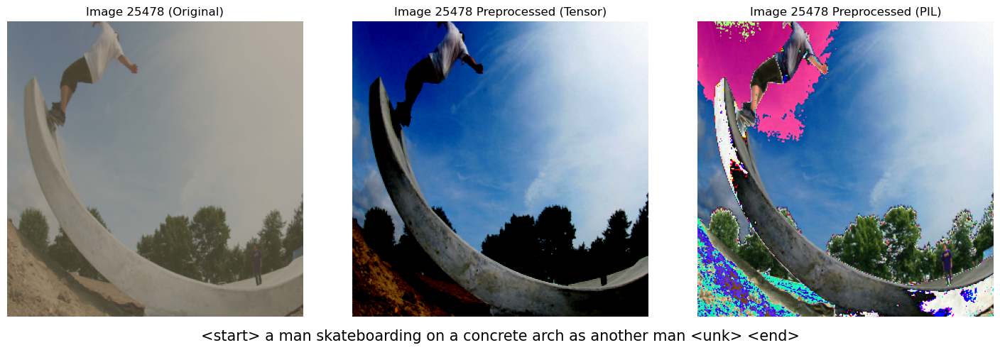

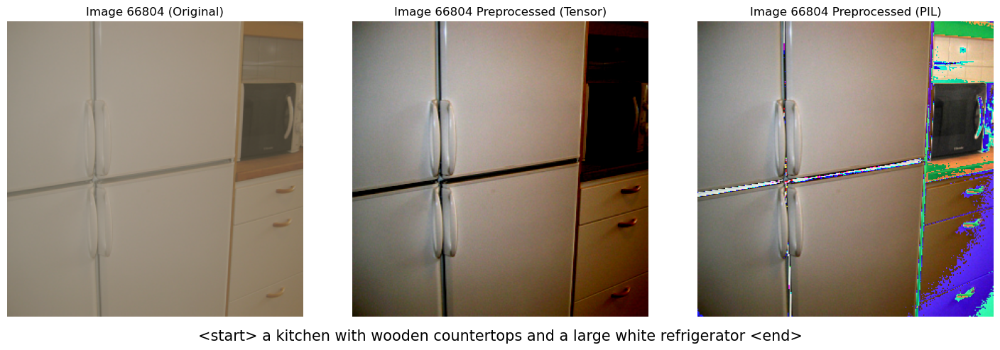

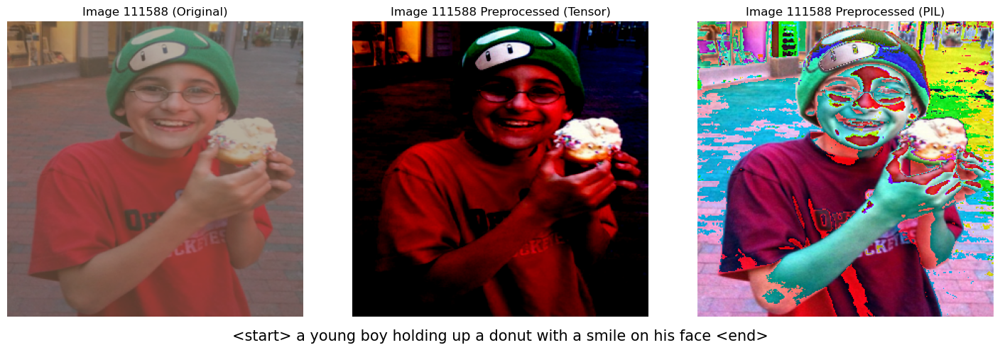

Vocab size:  10103
Validation Vocab size:  10103
Full dataset size(train+val):  123287
Train set size:  118287
Validation set size:  5000


In [4]:
#These are the transforms for inceptionv3
transform = transforms.Compose(
        [
            transforms.Resize((356, 356)),
            transforms.RandomCrop((299, 299)),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ]
    )


# Load the appropriate dataset based on configuration
if config['dataset'] == 'MS COCO':
    dataset = CustomCocoDataset(data_paths['COCO']['train']['root'], data_paths['COCO']['train']['annFile'], transform=transform, vocabFile = 'COCO_vocab.json')
    val_dataset = CustomCocoDataset(data_paths['COCO']['val']['root'], data_paths['COCO']['val']['annFile'], transform=transform, vocabFile = 'COCO_vocab.json')

elif config['dataset'] == 'Flickr30k' or config['dataset'] == 'Flickr8k':
  
    # Set seed for reproducibility
    torch.manual_seed(0)
  
    # Initialzation and data splitting into train and validation sets
    # 90/10 train/val split for both
    if config['dataset'] == 'Flickr8k':
        dataset = CustomFlickrDataset(data_paths['Flickr8k']['root'], data_paths['Flickr8k']['annFile'], transform=transform)
        indices = torch.randperm(len(dataset)).tolist()
        train_indices, val_indices = indices[:7282], indices[7282:]
    else:
        dataset = CustomFlickrDataset(data_paths['Flickr30k']['root'], data_paths['Flickr30k']['annFile'], transform=transform)
        indices = torch.randperm(len(dataset)).tolist()
        train_indices, val_indices = indices[:28604], indices[28604:]

    val_dataset = Subset(dataset, val_indices)
    dataset = Subset(dataset, train_indices)




# Experimentation with pretrained embeddings was conducted, but it did not yield better results
#pretrained_embeddings = load_pretrained_embeddings(dataset.vocab, glove_dim=300)

# Visualizing the dataset and printing its statistics to understand its composition and size
visualize_dataset(dataset, dataset.vocab)

print("Vocab size: ", len(dataset.vocab))
print("Validation Vocab size: ", len(val_dataset.vocab))
print("Full dataset size(train+val): ", len(dataset)+len(val_dataset))
print("Train set size: ", len(dataset))
print("Validation set size: ", len(val_dataset))



# Setting up the DataLoaders for the training and validation sets.
# The MyCollate class prepares batches by concatenating image tensors and padding captions for uniformity
pad_idx = dataset.vocab.stoi["<pad>"]
train_loader = DataLoader(dataset, batch_size=config['batch_size'], shuffle=True, num_workers=config['num_workers'], pin_memory=True, collate_fn=MyCollate(pad_idx=pad_idx))
val_loader = DataLoader(val_dataset, batch_size=config['batch_size'], shuffle=False, num_workers=config['num_workers'], pin_memory=True, collate_fn=MyCollate(pad_idx=pad_idx))


## Model Definition


### CNN Encoder



In [5]:

class EncoderCNN(nn.Module):
    def __init__(self, embed_size, train_CNN=False):
        super(EncoderCNN, self).__init__()
        self.train_CNN = train_CNN
        self.inception = models.inception_v3(weights="DEFAULT")
        self.inception.fc = nn.Linear(self.inception.fc.in_features, embed_size)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, images):
        features = self.inception(images)
      
        return self.dropout(self.relu(features[0]))


### RNN Decoder


In [6]:

class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers, pretrained_embeddings=None):
        super(DecoderRNN, self).__init__()
        if pretrained_embeddings is not None:
            assert pretrained_embeddings.size() == (vocab_size, embed_size), \
                "Pretrained embeddings shape must match the shape of embed layer"
            
        self.embed = nn.Embedding(vocab_size, embed_size)
        if pretrained_embeddings is not None:
            self.embed.weight.data.copy_(pretrained_embeddings)
            self.embed.weight.requires_grad = False     #True to fine-tune, False to freeze

        # *2 for feature/embed concatenation
        self.lstm = nn.LSTM(embed_size*2, hidden_size, num_layers)

        # For the hidden layer initialization
        self.hidden_init_lin = nn.Linear(embed_size, hidden_size)

        self.linear = nn.Linear(hidden_size, vocab_size)
        self.dropout = nn.Dropout(0.5)



    def init_hidden(self, features):
        features = self.hidden_init_lin(features)

        h0 = features.unsqueeze(0)  # unsqueeze to add batch dimension
        c0 = features.unsqueeze(0)  # optionally, you can have separate features for h0 and c0 if needed

        return h0, c0

    

    #Image Feature + Token Embed concatenation
    def forward(self, features, captions, teacher_forcing_ratio=1.0):
        # Initialize hidden states from image features
        h, c = self.init_hidden(features)
   
        features = features.unsqueeze(0).expand(captions.size(0), -1, -1)

        # Prepare an empty tensor to store the outputs
        outputs = torch.zeros(captions.size(0), captions.size(1), self.linear.out_features).to(captions.device)

        # First input to the LSTM will be the <start> token
        embedded_captions = self.embed(captions[0]).unsqueeze(0)
        input = torch.cat((embedded_captions, features[0].unsqueeze(0)), dim=2)

        out, (h, c) = self.lstm(input, (h, c))
        out = self.linear(out)
        out = out.squeeze(1)
        outputs[0] = out

        for t in range(1, captions.size(0)):  # for each time step
            # Determine if to use teacher forcing or not
            teacher_force = random.random() < teacher_forcing_ratio
            top1 = out.argmax(2)


            embedded_captions = self.dropout(self.embed(captions[t])) if teacher_force else self.embed(top1)
            if teacher_force:
                embedded_captions = embedded_captions.unsqueeze(0)
          
            input = torch.cat((embedded_captions, features[t].unsqueeze(0)), dim=2)

            out, (h, c) = self.lstm(input, (h, c))
            out = self.linear(out)
            out = out.squeeze(1)
            outputs[t] = out
            
        return outputs
    
     
        
    def sample(self, features, vocabulary, max_len=config['max_len']):
        result_caption = []
        
        # Initialize LSTM state using encoded image features
        h, c = self.init_hidden(features)
        
        # Expand the image features to have an additional sequence length dimension
        features = features.unsqueeze(0).expand(max_len, -1, -1)
        
        # Start with the <start> token as input
        input_token = vocabulary.stoi["<start>"]
        embedded_token = self.embed(torch.tensor([input_token], device=features.device)).unsqueeze(0)
        x = torch.cat((embedded_token, features[0].unsqueeze(0)), dim=2)

        # Sample the sequence
        for t in range(max_len):
            hiddens, (h, c) = self.lstm(x, (h, c))
            outputs = self.linear(hiddens)
            predicted = outputs.squeeze(1).argmax(1)
            result_caption.append(predicted.item())
            
            # Break if <end> token is predicted
            if vocabulary.itos[predicted.item()] == '<end>' or t+1 == max_len:
                break
                
            # Use predicted token as next input
            embedded_token = self.embed(predicted).unsqueeze(0)
            x = torch.cat((embedded_token, features[t+1].unsqueeze(0)), dim=2)  # Use t+1 to get the next feature

        return result_caption
 

### Image Captioning Model


In [7]:

class CNNtoRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers, pretrained_embeddings=None):
        super(CNNtoRNN, self).__init__()
        self.encoderCNN = EncoderCNN(embed_size)
        self.decoderRNN = DecoderRNN(embed_size, hidden_size, vocab_size, num_layers, pretrained_embeddings)


    def forward(self, images, captions, tfr=1.0):
        features = self.encoderCNN(images)
        outputs = self.decoderRNN(features, captions, tfr)
        return outputs
    

    def caption_image(self, image, vocabulary, max_len=config['max_len']):
        self.eval()

        with torch.no_grad():
            features = self.encoderCNN(image)
            result_caption = self.decoderRNN.sample(features.unsqueeze(0), vocabulary)

        self.train()
        return [vocabulary.itos[idx] for idx in result_caption]
 


## Model Training


In [8]:

torch.backends.cudnn.benchmark = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
load_model = False
save_model = True


model = CNNtoRNN(config['embed_size'], config['hidden_size'], len(dataset.vocab), config['num_layers']).to(device)


writer = SummaryWriter(get_logdir("runs/"))
step = 0


criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<pad>"])
optimizer = optim.Adam(model.parameters(), lr=config['learning_rate'])




#Training loop
def train_model(model, train_loader, criterion, optimizer, num_epochs, step):
    if load_model:
        step = load_checkpoint(torch.load("my_checkpoint.pth.tar"), model, optimizer)

    model.train()

    lowest_valLoss = 10
    highest_bleu = 0
    highest_meteor = 0

    big_bleus, small_vals, big_meteors = 0, 0, 0
    clip_value = 1.0  

    start_TFR = 1.0
    end_TFR = 0.0


    for epoch in range(num_epochs):
        #current_TFR = max(0, linear_tfr(start_TFR, end_TFR, epoch,1000))
        current_TFR = 0.99
        print(f"Epoch {epoch + 1}: TFR = {current_TFR:.2f}")

        total_loss = 0
        
        for i, (imgs, captions) in enumerate(train_loader):
            
            imgs, captions = imgs.to(device), captions.to(device)

            # Tensorboard Logging
            if i % 1000 == 0:
                log_to_tensorboard(device, model, imgs, captions, dataset.vocab, config['max_len'], epoch, i, writer)

            #"We want the model to learn how to predict the end token, so we are not going to predict the end token."
            outputs = model(imgs, captions[:-1], current_TFR)

            loss = criterion(outputs.reshape(-1, outputs.shape[2]), captions[1:, :].reshape(-1))

            step += 1

            optimizer.zero_grad()
            loss.backward()

            torch.nn.utils.clip_grad_norm_(model.parameters(), clip_value)


            optimizer.step()
            
            total_loss += loss.item()

 
        # Training Loss
        avg_loss = total_loss / len(train_loader) 

        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}")
        writer.add_scalar("Loss/Epoch_Avg", avg_loss, epoch)

        # Validation Loss
        val_loss = validation_loss(model, val_loader, criterion, writer, epoch, current_TFR)
        # Calling twice to calculate/log the "raw" validation loss, which is just the 
        # validation loss when the model is entirely dependant on its own predictions (TFR=0)
        validation_loss(model, val_loader, criterion, writer, epoch, 0)


        #Check BLEU Scores,  every N epochs
        #if epoch % 5 == 0:
        _,_,_,b4 = compute_bleu_scores(val_dataset, model, dataset.vocab, epoch, max_len=config['max_len'], writer=writer)
        meteor = compute_meteor_score(val_dataset, model, dataset.vocab, epoch, writer=writer)

        #Ensure the lowest Validation Loss and highest BLEU4 Score are saved
        if val_loss < lowest_valLoss:
            lowest_valLoss = val_loss
            small_vals += 1
            if save_model:
                checkpoint = {
                    "state_dict" : model.state_dict(),
                    "optimizer" : optimizer.state_dict(),
                    "step" : step,
                }
                save_checkpoint(checkpoint, filename=f"COCO_Run_0/lowest_Val_Loss{small_vals}_epoch{epoch}.pth.tar")
        
        if b4 > highest_bleu:
            highest_bleu = b4
            big_bleus += 1
            if save_model:
                checkpoint = {
                    "state_dict" : model.state_dict(),
                    "optimizer" : optimizer.state_dict(),
                    "step" : step,
                }
                save_checkpoint(checkpoint, filename=f"COCO_Run_0/highest_bleu{big_bleus}_epoch{epoch}.pth.tar")
        
        if meteor > highest_meteor:
            highest_meteor = meteor
            big_meteors += 1
            if save_model:
                checkpoint = {
                    "state_dict" : model.state_dict(),
                    "optimizer" : optimizer.state_dict(),
                    "step" : step,
                }
                save_checkpoint(checkpoint, filename=f"COCO_Run_0/highest_meteor{big_meteors}_epoch{epoch}.pth.tar")

#train_model(model, train_loader, criterion, optimizer, config['epochs'], step)


Epoch 1: TFR = 0.99
Epoch 1: Processing batch 0
Epoch 1: Processing batch 1000
Epoch 1: Processing batch 2000
Epoch 1: Processing batch 3000
Epoch 1: Processing batch 4000
Epoch 1: Processing batch 5000
Epoch 1: Processing batch 6000
Epoch 1: Processing batch 7000
Epoch 1: Processing batch 8000
Epoch 1: Processing batch 9000
Epoch 1: Processing batch 10000
Epoch 1: Processing batch 11000
Epoch 1: Processing batch 12000
Epoch 1: Processing batch 13000
Epoch 1: Processing batch 14000
Epoch [1/250], Loss: 3.8405
Validation Loss after Epoch 0: 3.3414546192169188
Raw Validation Loss after Epoch 0: 5.988477378082275
Calculating BLEU Scores...
BLEU Scores: 
BLEU-1 Score: 0.5701854678906656
BLEU-2 Score: 0.38398175854518624
BLEU-3 Score: 0.2515181266328684
BLEU-4 Score: 0.1570402244912516
Calculating METEOR Scores...
METEOR Score: 0.3338
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
Epoch 2: TFR = 0.99
Epoch 2: Processing batch 0
Epoch 2: Processing batch 1000
Epoch 2: Process

## Model Evaluation


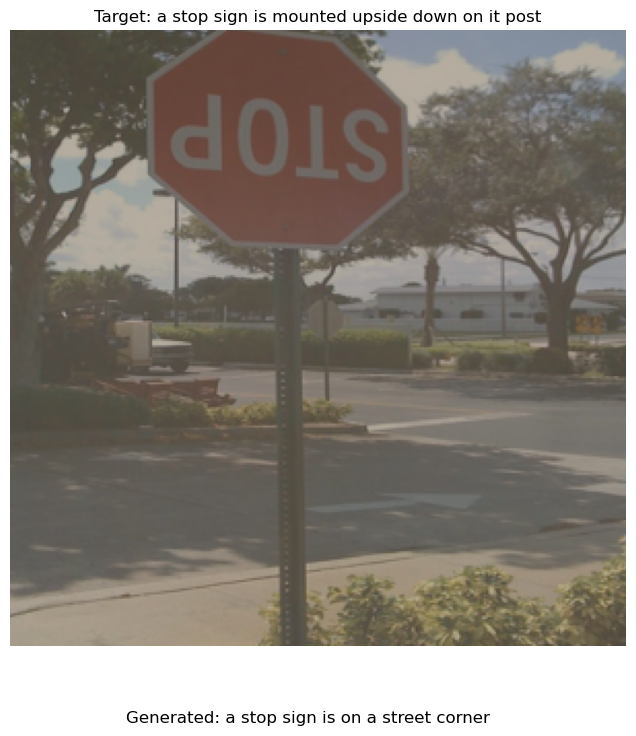

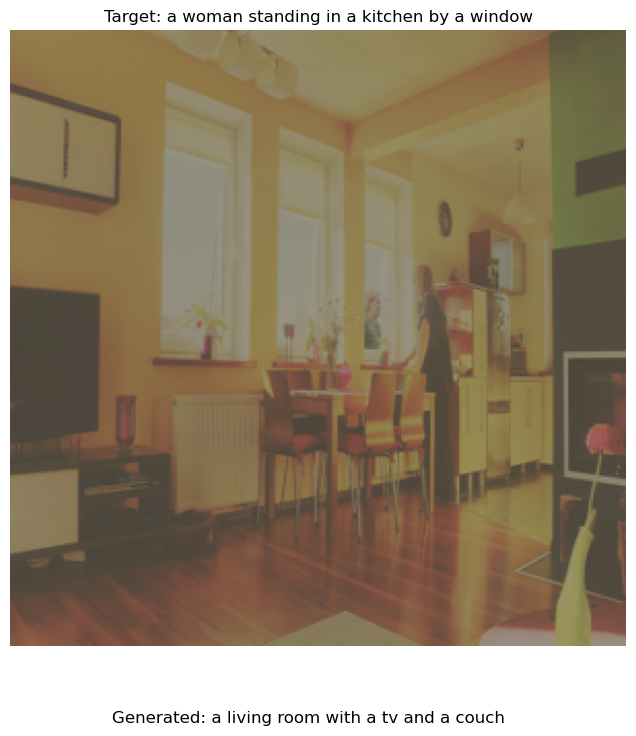

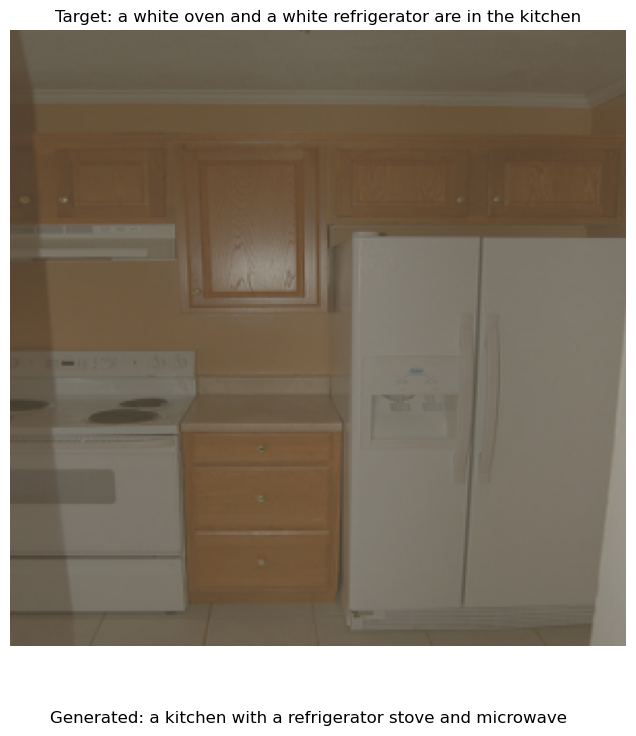

Calculating BLEU Scores...
BLEU Scores: 
BLEU-1 Score: 0.6640273210317506
BLEU-2 Score: 0.4887446997417748
BLEU-3 Score: 0.3564439302969542
BLEU-4 Score: 0.255566737624506
Calculating METEOR Scores...
METEOR Score: 0.4227


0.4227153372077092

In [9]:
#step = load_checkpoint(torch.load("COCO_Run_0/highest_bleu31_epoch76.pth.tar"), model, optimizer)

visualize_caption_generation(model, val_loader, dataset.vocab, config['max_len'], device, numDisplayed=3)
        
compute_bleu_scores(val_dataset, model, dataset.vocab, epoch=0, max_len=config['max_len'], writer=writer)
compute_meteor_score(val_dataset, model, dataset.vocab, epoch=0, writer=writer)

## Test Set
The test set comprises of random images from my phone's camera roll, and were selected to provide a challenging yet realistic distribution of photos that may be wanted to be captioned. This can help see the effectiveness of the model, but also expose some of both the model's and the training set's short comings/under-representations.

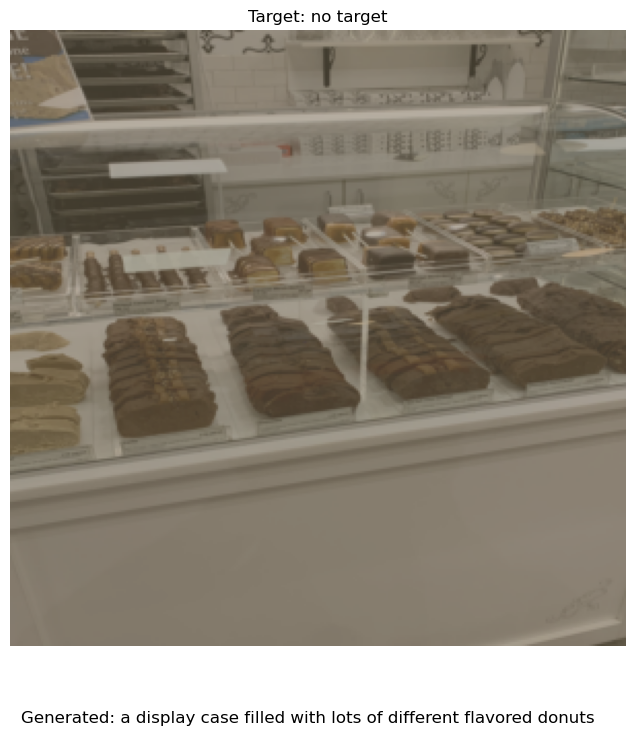

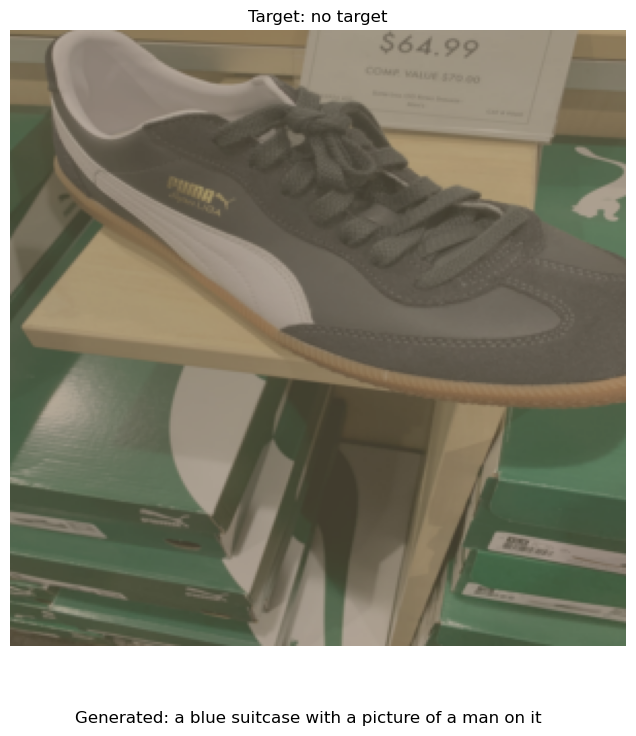

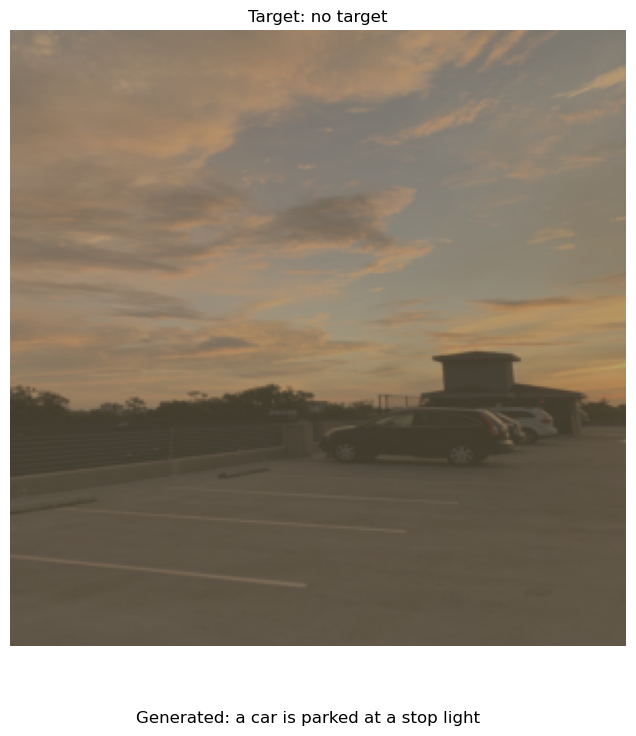

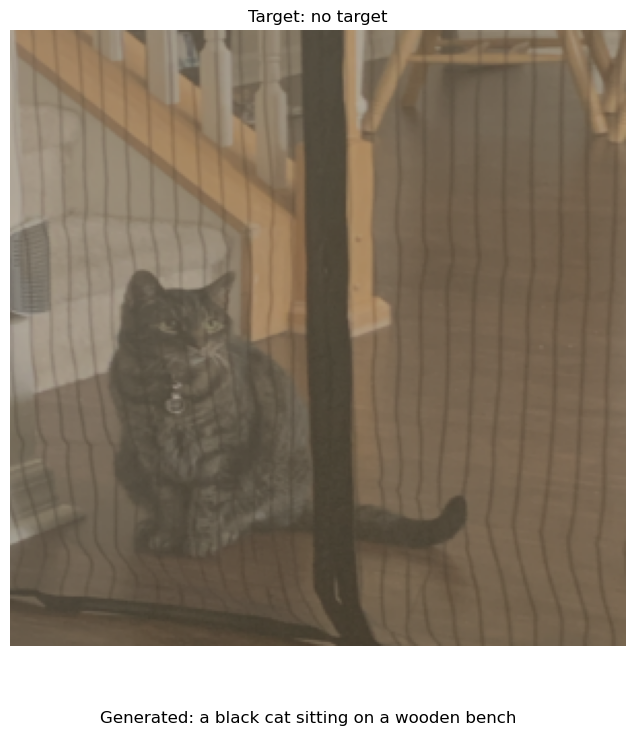

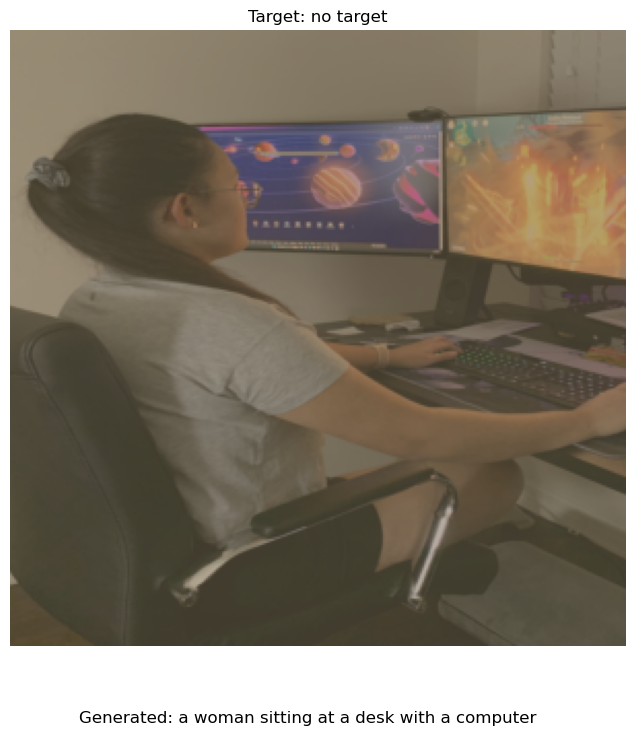

...

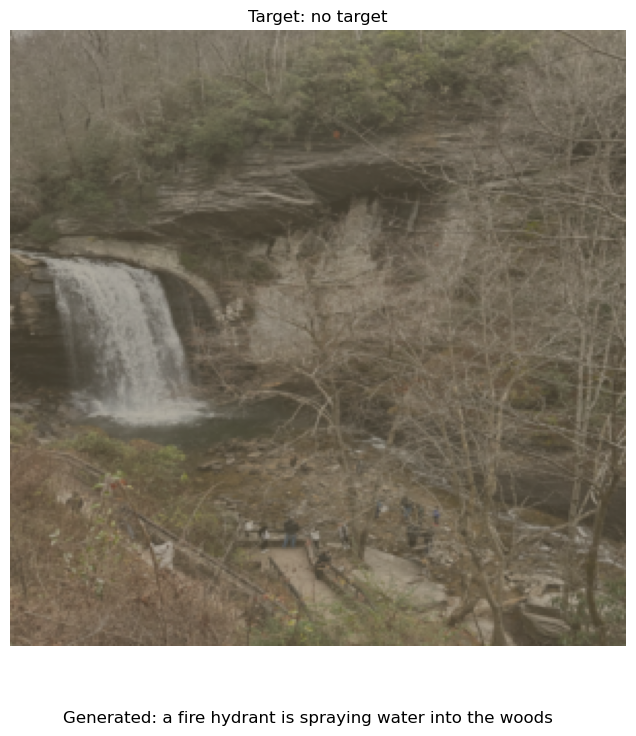

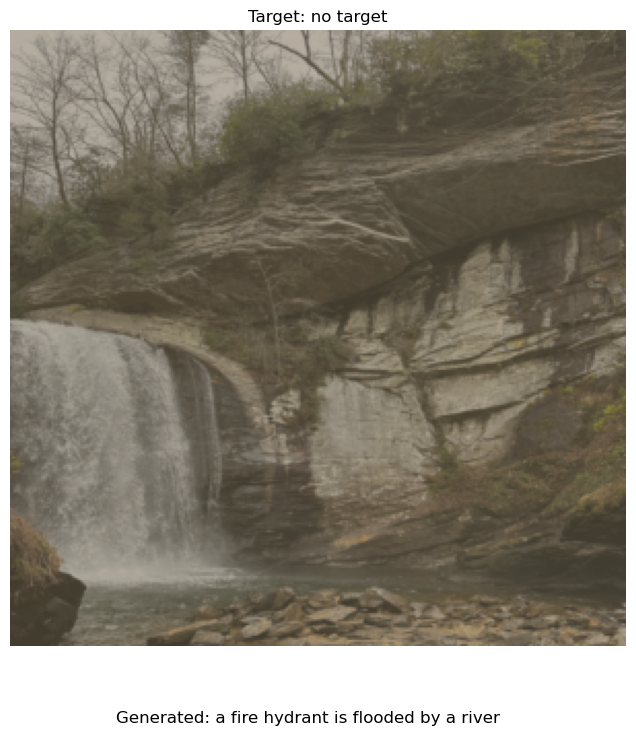

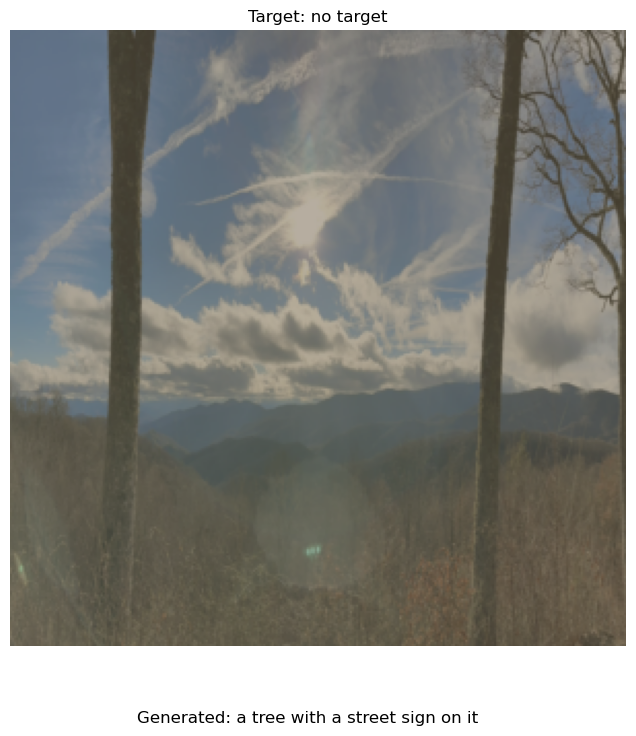

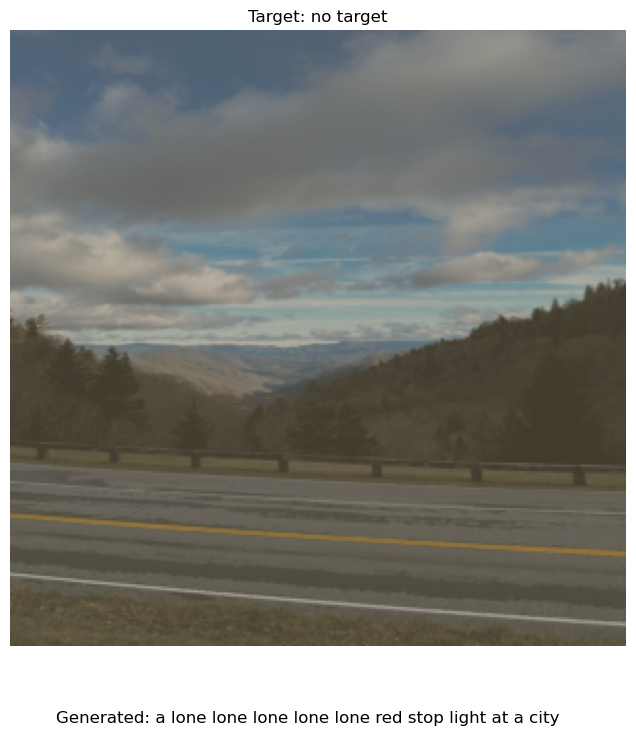

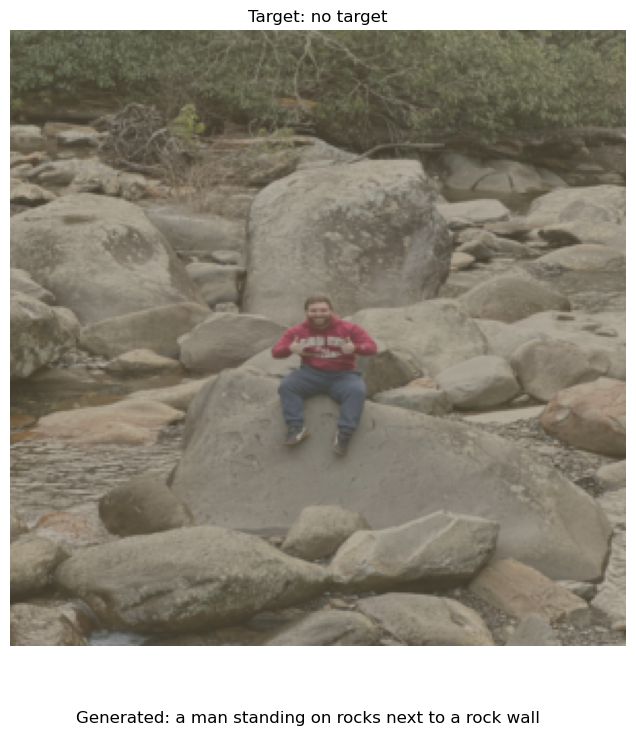

In [10]:
# Test set made into custom Flickr format 
test_set = CustomFlickrDataset(data_paths['Test_Set']['root'], data_paths['Test_Set']['annFile'], transform=transform)
test_set.set_vocab(dataset.vocab)

test_loader = DataLoader(test_set, batch_size=config['batch_size'], shuffle=False, num_workers=config['num_workers'], pin_memory=True, collate_fn=MyCollate(pad_idx=pad_idx))

visualize_caption_generation(model, test_loader, dataset.vocab, config['max_len'], device)

## Conclusion



## References
